# Preprocessing and Exploration

In [1]:
from PIL import Image

In [2]:
img_path="/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Apple___healthy/00907d8b-6ae6-4306-bfd7-d54471981a86___RS_HL 5709_flipTB.JPG"

In [3]:
img=Image.open(img_path)

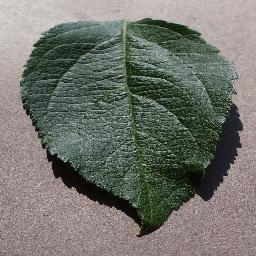

In [4]:
img

In [5]:
import os
from collections import defaultdict
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns


In [6]:
train_dir="/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"

In [7]:
classes=os.listdir(train_dir)

In [8]:
images_pathes_col=[]
images_classes_col=[]


for cls in classes:

  cls_full_path=os.path.join(train_dir,cls)

  images_name=os.listdir(cls_full_path)

  imgs_full_path=[ os.path.join(cls_full_path,img_name) for img_name in images_name]

  image_classes=[ cls for img_path in imgs_full_path]

  images_pathes_col.extend(imgs_full_path)
  images_classes_col.extend(image_classes)


In [9]:
data_map=pd.DataFrame({
    "images":images_pathes_col,
    "classes":images_classes_col
})

In [10]:
data_map

,images,classes
0,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
1,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
2,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
3,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
4,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
...,...,...
70290,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy
70291,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy
70292,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy
70293,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy


In [11]:
classes_dist=data_map["classes"].value_counts()

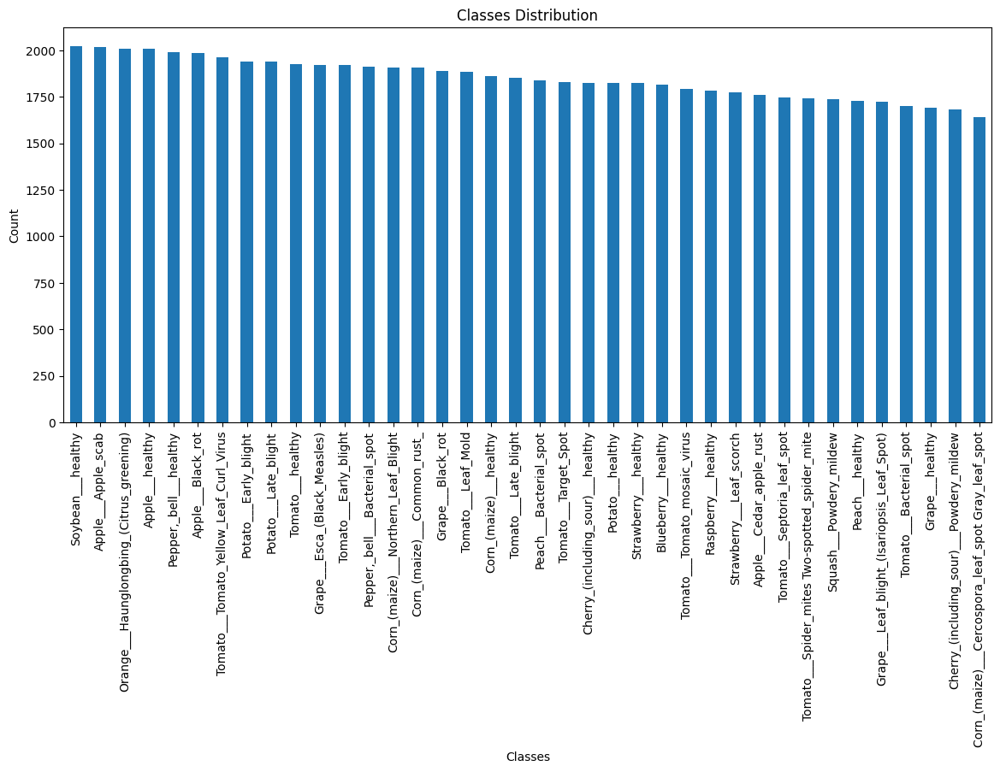

In [12]:
plt.figure(figsize=(14,6))

classes_dist.plot(kind="bar")

plt.title("Classes Distribution")
plt.xlabel("Classes")
plt.ylabel("Count")
plt.show()

In [13]:
import random

In [14]:
unique_classes = data_map['classes'].unique()

In [15]:
print("num of classes :", len(unique_classes))


num of classes : 38


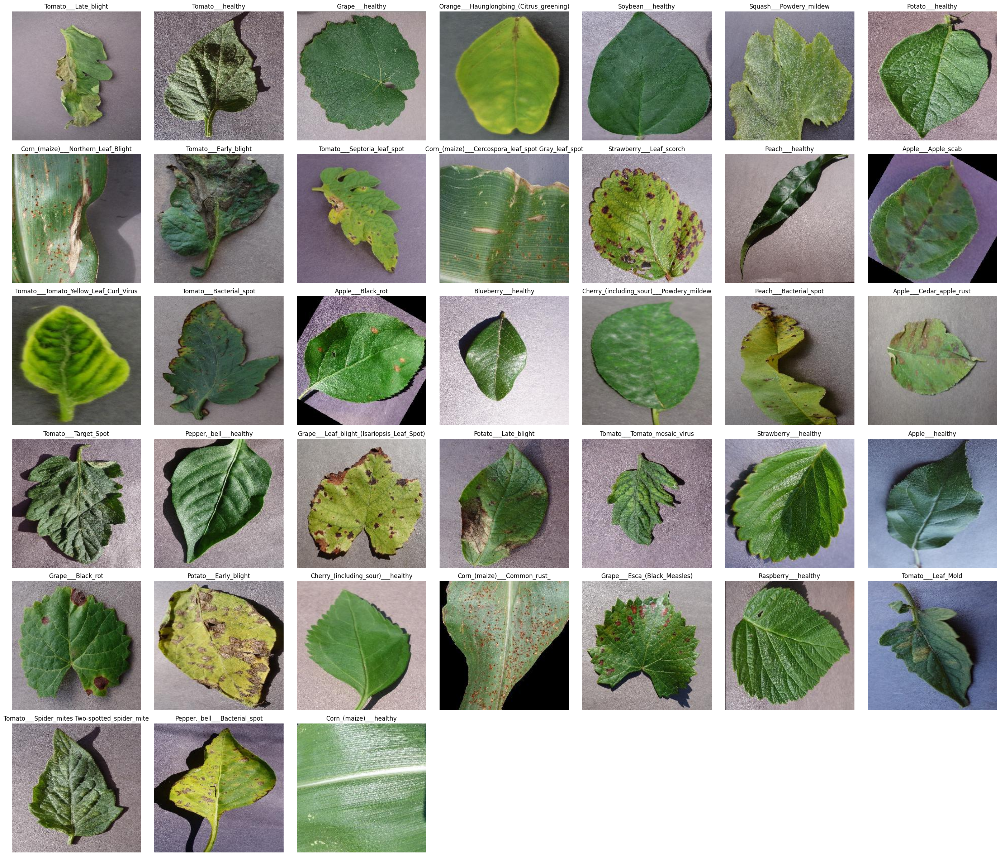

In [16]:
rows, cols = 6, 7
plt.figure(figsize=(cols * 4, rows * 4))

for i, class_name in enumerate(unique_classes):
  class_images=data_map[data_map["classes"]==class_name]["images"].values


  image_path=random.choice(class_images)

  img=Image.open(image_path)

  plt.subplot(rows, cols, i + 1)
  plt.imshow(img)
  plt.title(class_name)
  plt.axis('off')

plt.tight_layout()
plt.show()

In [17]:
pip install torch torchvision

Note: you may need to restart the kernel to use updated packages.


In [18]:
import os
from torchvision import transforms,models
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, WeightedRandomSampler
import torch
import torch.nn as nn
import torch.optim as optim
from collections import Counter
from tqdm import tqdm
import time


In [19]:
num_batches=128

In [20]:
img_transform=transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

Text(0.5, 1.0, 'Transformed')

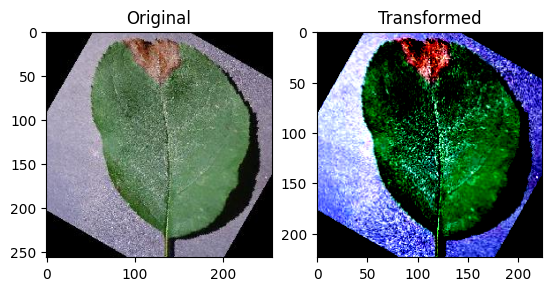

In [21]:
img = Image.open("/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Apple___Black_rot/0139bc6d-391c-4fd1-bcae-cc74dabfddd7___JR_FrgE.S 2734_new30degFlipLR.JPG")
transformed = img_transform(img)

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")

plt.subplot(1, 2, 2)
plt.imshow(transformed.permute(1, 2, 0))
plt.title("Transformed")


In [22]:
train_dataset=ImageFolder(root=train_dir,transform=img_transform)

In [23]:
labels=train_dataset.targets

classes_count=Counter(labels)

class_weights={cls: 1.0/count for cls,count in classes_count.items()}
sample_weights=[class_weights[label] for label in labels]

sampler=WeightedRandomSampler(weights=sample_weights,num_samples=len(sample_weights),replacement=True)

In [24]:
train_loader = DataLoader(train_dataset, batch_size=num_batches, sampler=sampler,num_workers=2)

In [25]:
valid_dir="/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"

In [26]:
val_dataset=ImageFolder(root=valid_dir,transform=img_transform)

In [27]:
val_loader=DataLoader(val_dataset,batch_size=num_batches,shuffle=True)

# fine_tune model

In [28]:
model=models.resnet18(pretrained=True)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [29]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [30]:
model.fc=nn.Linear(in_features=512, out_features=38, bias=True)

In [31]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [32]:
device=("cuda")

In [33]:
model=model.to(device)

In [34]:
loss_fun=nn.CrossEntropyLoss()
optimizer=optim.Adam(model.parameters(),lr=0.001)

# training

In [36]:
epochs=10
best_val_acc = 0.0

for epoch in range(epochs):
    model.train()
    total_loss = 0.0
    total_correct = 0
    total_samples = 0

    loop = tqdm(train_loader, total=len(train_loader), desc=f"Epoch [{epoch+1}/{epochs}]")

    for images, labels in loop:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = loss_fun(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        preds = torch.argmax(outputs, dim=1)
        total_correct += (preds == labels).sum().item()
        total_samples += labels.size(0)

        loop.set_postfix(loss=loss.item())

    epoch_loss = total_loss / len(train_loader)
    epoch_acc = total_correct / total_samples

    print(f"\n Train Epoch {epoch+1}: Loss = {epoch_loss:.4f}, Accuracy = {epoch_acc*100:.2f}%")

    #  VALIDATION
    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = loss_fun(outputs, labels)

            val_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            val_correct += (preds == labels).sum().item()
            val_total += labels.size(0)

    val_acc = val_correct / val_total
    val_loss = val_loss / len(val_loader)

    print(f" Validation: Loss = {val_loss:.4f}, Accuracy = {val_acc*100:.2f}%\n")


    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), "best_model.pth")
        print("Best model saved!\n")


Epoch [1/10]: 100%|██████████| 550/550 [02:42<00:00,  3.38it/s, loss=0.0352]



 Train Epoch 1: Loss = 0.1464, Accuracy = 95.74%
 Validation: Loss = 0.1443, Accuracy = 95.31%

Best model saved!



Epoch [2/10]: 100%|██████████| 550/550 [02:42<00:00,  3.38it/s, loss=0.0869] 



 Train Epoch 2: Loss = 0.0512, Accuracy = 98.40%
 Validation: Loss = 0.1180, Accuracy = 96.18%

Best model saved!



Epoch [3/10]: 100%|██████████| 550/550 [02:45<00:00,  3.33it/s, loss=0.0102] 



 Train Epoch 3: Loss = 0.0417, Accuracy = 98.70%
 Validation: Loss = 0.0736, Accuracy = 97.79%

Best model saved!



Epoch [4/10]: 100%|██████████| 550/550 [02:43<00:00,  3.37it/s, loss=0.00081] 



 Train Epoch 4: Loss = 0.0312, Accuracy = 98.99%
 Validation: Loss = 0.0447, Accuracy = 98.51%

Best model saved!



Epoch [5/10]: 100%|██████████| 550/550 [02:52<00:00,  3.20it/s, loss=0.0334]  



 Train Epoch 5: Loss = 0.0308, Accuracy = 99.00%
 Validation: Loss = 0.0574, Accuracy = 98.25%



Epoch [6/10]: 100%|██████████| 550/550 [02:54<00:00,  3.16it/s, loss=0.0101]  



 Train Epoch 6: Loss = 0.0211, Accuracy = 99.35%
 Validation: Loss = 0.0673, Accuracy = 97.80%



Epoch [7/10]: 100%|██████████| 550/550 [03:02<00:00,  3.01it/s, loss=0.112]   



 Train Epoch 7: Loss = 0.0258, Accuracy = 99.23%
 Validation: Loss = 0.0737, Accuracy = 97.83%



Epoch [8/10]: 100%|██████████| 550/550 [03:06<00:00,  2.95it/s, loss=0.265]   



 Train Epoch 8: Loss = 0.0199, Accuracy = 99.39%
 Validation: Loss = 0.0667, Accuracy = 98.01%



Epoch [9/10]: 100%|██████████| 550/550 [02:54<00:00,  3.16it/s, loss=0.00202] 



 Train Epoch 9: Loss = 0.0241, Accuracy = 99.27%
 Validation: Loss = 0.0289, Accuracy = 99.15%

Best model saved!



Epoch [10/10]: 100%|██████████| 550/550 [02:53<00:00,  3.18it/s, loss=0.772]   



 Train Epoch 10: Loss = 0.0106, Accuracy = 99.72%
 Validation: Loss = 0.1484, Accuracy = 96.52%



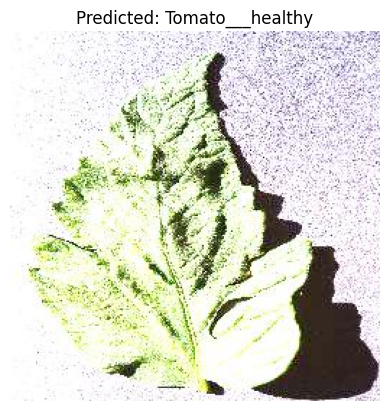

In [53]:
model.load_state_dict(torch.load("/kaggle/working/best_model.pth"))
model.to(device)
model.eval()

from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms

img_path="/kaggle/input/new-plant-diseases-dataset/test/test/TomatoHealthy4.JPG"

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

])


img = Image.open(img_path).convert("RGB")
input_tensor = transform(img).unsqueeze(0).to(device)


with torch.no_grad():
    output = model(input_tensor)
    pred = torch.argmax(output, dim=1).item()

plt.imshow(img)
plt.title(f"Predicted: {train_dataset.classes[pred]}")
plt.axis('off')
plt.show()